In [1]:
# from transformers import AutoFeatureExtractor, SwinForImageClassification
# from PIL import Image
# import requests

# url = "http://images.cocodataset.org/val2017/000000039769.jpg"
# image = Image.open(requests.get(url, stream=True).raw)

# feature_extractor = AutoFeatureExtractor.from_pretrained("microsoft/swin-tiny-patch4-window7-224")
# model = SwinForImageClassification.from_pretrained("microsoft/swin-tiny-patch4-window7-224")

# inputs = feature_extractor(images=image, return_tensors="pt")
# outputs = model(**inputs)
# logits = outputs.logits
# # model predicts one of the 1000 ImageNet classes
# predicted_class_idx = logits.argmax(-1).item()
# print("Predicted class:", model.config.id2label[predicted_class_idx])



In [2]:
from datasets import load_dataset


/home/gegg00/mambaforge/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
!pip install 'datasets[vision]'

In [4]:
from datasets import load_dataset, Image

In [5]:
import pandas as pd
df = pd.read_csv('train.csv')
df['image_loc']='./train_images/'+df['label']+'/'+df['image_id']

In [6]:
df.label = df.label.astype('category')
#df['labels'] = df.label.cat.codes

In [7]:
from datasets import Dataset


#dataset = Dataset.from_dict({"image": ["path/to/image_1", "path/to/image_2", ..., "path/to/image_n"]}).cast_column("image", Image())
dataset = Dataset.from_dict({col:[item for item in df[col]] for col in df.columns}).cast_column("image_loc", Image())

In [8]:
dataset[0]


{'image_id': '100330.jpg',
 'label': 'bacterial_leaf_blight',
 'variety': 'ADT45',
 'age': 45,
 'image_loc': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=480x640>}

In [9]:
from datasets import ClassLabel

disease_label = ClassLabel(num_classes = len(list(df.label.cat.categories)),names=list(df.label.cat.categories))

#dataset = dataset.cast_column("labels", disease_label)


In [10]:
disease_label

ClassLabel(num_classes=10, names=['bacterial_leaf_blight', 'bacterial_leaf_streak', 'bacterial_panicle_blight', 'blast', 'brown_spot', 'dead_heart', 'downy_mildew', 'hispa', 'normal', 'tungro'], id=None)

In [11]:
dataset = dataset.cast_column("label", disease_label)

Casting the dataset: 100%|██████████| 2/2 [00:00<00:00, 24.39ba/s]


In [12]:
dataset[0]

{'image_id': '100330.jpg',
 'label': 0,
 'variety': 'ADT45',
 'age': 45,
 'image_loc': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=480x640>}

In [13]:
df_tst = pd.read_csv('./sample_submission.csv')

In [14]:
df_tst['image_loc']='./test_images/'+df_tst['image_id']
xyz = {col:[item for item in df_tst[col]] for col in df_tst.columns}
#del xyz['label']


In [15]:
#ds_tst = Dataset.from_dict(xyz)
ds_tst = Dataset.from_dict({col:[item for item in df_tst[col]] for col in df_tst.columns}).cast_column("image_loc", Image())
#ds_tst = ds_tst.cast_column("image_loc", Image())

In [16]:
ds_tst = ds_tst.cast_column("image_loc", Image())

In [17]:
from datasets import DatasetDict
#train_testvalid = dataset.train_test_split(train_size=0.8, test_size=0.15, valid_size=0.05)
# dataset is already `map`'d and already has `set_format`
# 90% train, 10% test + validation
train_testvalid = dataset.train_test_split(test_size=0.1)
# Split the 10% test + valid in half test, half valid
#test_valid = train_testvalid["test"].train_test_split(test_size=0.5)
# gather everyone if you want to have a single DatasetDict
datasets = DatasetDict({
    "train": train_testvalid["train"],
    "valid": train_testvalid["test"],    
    "test": ds_tst})

100%|██████████| 10/10 [00:30<00:00,  3.03s/ba]


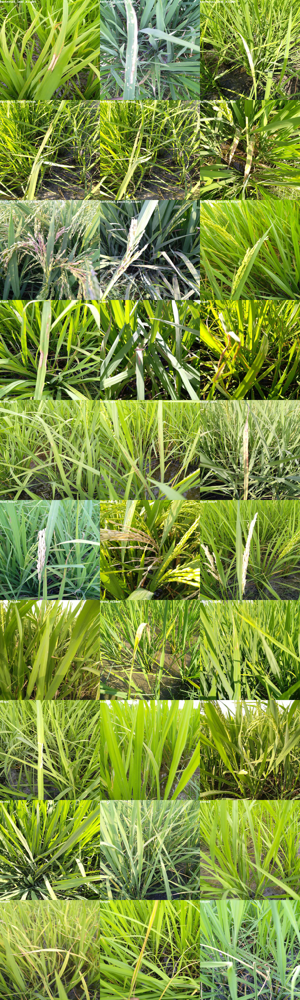

In [18]:
import random
from PIL import ImageDraw, ImageFont, Image
#font = ImageFont.load("arial.pil")
def show_examples(ds, seed: int = 1234, examples_per_class: int = 3, size=(350, 350)):

    w, h = size
    labels = ds['train'].features['label'].names
    grid = Image.new('RGB', size=(examples_per_class * w, len(labels) * h))
    draw = ImageDraw.Draw(grid)
    #font = ImageFont.truetype("arial.ttf", 24)

    for label_id, label in enumerate(labels):

        # Filter the dataset by a single label, shuffle it, and grab a few samples
        ds_slice = ds['train'].filter(lambda ex: ex['label'] == label_id).shuffle(seed).select(range(examples_per_class))

        # Plot this label's examples along a row
        for i, example in enumerate(ds_slice):
            image = example['image_loc']
            idx = examples_per_class * label_id + i
            box = (idx % examples_per_class * w, idx // examples_per_class * h)
            grid.paste(image.resize(size), box=box)
            draw.text(box, label, (255, 255, 255))
            #, font=font)

    return grid

show_examples(datasets, seed=random.randint(0, 1337), examples_per_class=3)



In [19]:
from transformers import ViTFeatureExtractor

model_name_or_path = 'google/vit-base-patch16-224-in21k'
feature_extractor = ViTFeatureExtractor.from_pretrained(model_name_or_path)



In [20]:
feature_extractor(datasets['train'][0]['image_loc'])

{'pixel_values': [array([[[ 0.18431377, -0.10588235, -0.01176471, ...,  0.18431377,
          0.26274514,  0.04313731],
        [ 0.3176471 , -0.05882353, -0.05098039, ...,  0.2313726 ,
          0.28627455,  0.0196079 ],
        [ 0.5137255 ,  0.04313731, -0.0745098 , ...,  0.26274514,
          0.22352946, -0.05098039],
        ...,
        [-0.6862745 , -0.62352943, -0.6392157 , ..., -0.5137255 ,
         -0.5372549 , -0.54509807],
        [-0.75686276, -0.654902  , -0.4980392 , ..., -0.6862745 ,
         -0.47450978, -0.47450978],
        [-0.77254903, -0.7647059 , -0.69411767, ..., -0.8745098 ,
         -0.827451  , -0.7254902 ]],

       [[ 0.5529412 ,  0.2941177 ,  0.41960788, ...,  0.56078434,
          0.6392157 ,  0.37254906],
        [ 0.60784316,  0.28627455,  0.34901965, ...,  0.6156863 ,
          0.6627451 ,  0.34901965],
        [ 0.73333335,  0.34901965,  0.30196083, ...,  0.64705884,
          0.60784316,  0.28627455],
        ...,
        [-0.52156866, -0.4980392 , -

In [21]:
def process_example(example):
    inputs = feature_extractor(example['image_loc'], return_tensors='pt')
    inputs['label'] = example['label']
    return inputs



In [22]:
process_example(datasets['train'][0])

{'pixel_values': tensor([[[[ 0.1843, -0.1059, -0.0118,  ...,  0.1843,  0.2627,  0.0431],
          [ 0.3176, -0.0588, -0.0510,  ...,  0.2314,  0.2863,  0.0196],
          [ 0.5137,  0.0431, -0.0745,  ...,  0.2627,  0.2235, -0.0510],
          ...,
          [-0.6863, -0.6235, -0.6392,  ..., -0.5137, -0.5373, -0.5451],
          [-0.7569, -0.6549, -0.4980,  ..., -0.6863, -0.4745, -0.4745],
          [-0.7725, -0.7647, -0.6941,  ..., -0.8745, -0.8275, -0.7255]],

         [[ 0.5529,  0.2941,  0.4196,  ...,  0.5608,  0.6392,  0.3725],
          [ 0.6078,  0.2863,  0.3490,  ...,  0.6157,  0.6627,  0.3490],
          [ 0.7333,  0.3490,  0.3020,  ...,  0.6471,  0.6078,  0.2863],
          ...,
          [-0.5216, -0.4980, -0.5686,  ..., -0.4745, -0.5059, -0.5373],
          [-0.5373, -0.4902, -0.4196,  ..., -0.6471, -0.4510, -0.4667],
          [-0.5059, -0.5608, -0.6000,  ..., -0.8510, -0.8275, -0.7569]],

         [[-0.8039, -0.9216, -0.8980,  ..., -0.8745, -0.8745, -0.9451],
          [-0

In [23]:
def transform(example_batch):
    # Take a list of PIL images and turn them to pixel values
    inputs = feature_extractor([x for x in example_batch['image_loc']], return_tensors='pt')

    # Don't forget to include the labels!
    inputs['labels'] = example_batch['label']
    return inputs

In [24]:
prepared_ds = datasets.with_transform(transform)


Parameter 'transform'=<function transform at 0x7fc85c5060d0> of the transform datasets.arrow_dataset.Dataset.set_format couldn't be hashed properly, a random hash was used instead. Make sure your transforms and parameters are serializable with pickle or dill for the dataset fingerprinting and caching to work. If you reuse this transform, the caching mechanism will consider it to be different from the previous calls and recompute everything. This warning is only showed once. Subsequent hashing failures won't be showed.


In [25]:
prepared_ds['train'][0:2]

{'pixel_values': tensor([[[[ 0.1843, -0.1059, -0.0118,  ...,  0.1843,  0.2627,  0.0431],
          [ 0.3176, -0.0588, -0.0510,  ...,  0.2314,  0.2863,  0.0196],
          [ 0.5137,  0.0431, -0.0745,  ...,  0.2627,  0.2235, -0.0510],
          ...,
          [-0.6863, -0.6235, -0.6392,  ..., -0.5137, -0.5373, -0.5451],
          [-0.7569, -0.6549, -0.4980,  ..., -0.6863, -0.4745, -0.4745],
          [-0.7725, -0.7647, -0.6941,  ..., -0.8745, -0.8275, -0.7255]],

         [[ 0.5529,  0.2941,  0.4196,  ...,  0.5608,  0.6392,  0.3725],
          [ 0.6078,  0.2863,  0.3490,  ...,  0.6157,  0.6627,  0.3490],
          [ 0.7333,  0.3490,  0.3020,  ...,  0.6471,  0.6078,  0.2863],
          ...,
          [-0.5216, -0.4980, -0.5686,  ..., -0.4745, -0.5059, -0.5373],
          [-0.5373, -0.4902, -0.4196,  ..., -0.6471, -0.4510, -0.4667],
          [-0.5059, -0.5608, -0.6000,  ..., -0.8510, -0.8275, -0.7569]],

         [[-0.8039, -0.9216, -0.8980,  ..., -0.8745, -0.8745, -0.9451],
          [-0

In [26]:
import torch
torch.device("cuda:0")
def collate_fn(batch):
    return {
        'pixel_values': torch.stack([x['pixel_values'] for x in batch]),
        'labels': torch.tensor([x['labels'] for x in batch])
    }



In [27]:
import numpy as np
from datasets import load_metric

metric = load_metric("accuracy")
def compute_metrics(p):
    return metric.compute(predictions=np.argmax(p.predictions, axis=1), references=p.label_ids)



In [28]:
from transformers import ViTForImageClassification

labels = datasets['train'].features['label'].names
print(labels)
model = ViTForImageClassification.from_pretrained(
    model_name_or_path,
    num_labels=len(labels),
    id2label={str(i): c for i, c in enumerate(labels)},
    label2id={c: str(i) for i, c in enumerate(labels)}
)
#model.to('mps')



['bacterial_leaf_blight', 'bacterial_leaf_streak', 'bacterial_panicle_blight', 'blast', 'brown_spot', 'dead_heart', 'downy_mildew', 'hispa', 'normal', 'tungro']


Some weights of the model checkpoint at google/vit-base-patch16-224-in21k were not used when initializing ViTForImageClassification: ['pooler.dense.weight', 'pooler.dense.bias']
- This IS expected if you are initializing ViTForImageClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing ViTForImageClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [29]:
from transformers import TrainingArguments
import os
os.environ["WANDB_DISABLED"] = "true"

training_args = TrainingArguments(
  output_dir="./vit-base-beans",
  per_device_train_batch_size=16,
  evaluation_strategy="steps",
  num_train_epochs=4,
  fp16=False,
  save_steps=100,
  eval_steps=100,
  logging_steps=10,
  learning_rate=2e-4,
  save_total_limit=2,
  remove_unused_columns=False,
  push_to_hub=False,
  load_best_model_at_end=True,
)



Using the `WAND_DISABLED` environment variable is deprecated and will be removed in v5. Use the --report_to flag to control the integrations used for logging result (for instance --report_to none).


In [30]:
from transformers import Trainer

trainer = Trainer(
    model=model,
    args=training_args,
    data_collator=collate_fn,
    compute_metrics=compute_metrics,
    train_dataset=prepared_ds["train"],
    eval_dataset=prepared_ds["valid"],
    tokenizer=feature_extractor,
)



In [31]:

train_results = trainer.train()
trainer.save_model()
trainer.log_metrics("train", train_results.metrics)
trainer.save_metrics("train", train_results.metrics)
trainer.save_state()



/home/gegg00/mambaforge/lib/python3.9/site-packages/transformers/optimization.py:306: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(
***** Running training *****
  Num examples = 9366
  Num Epochs = 4
  Instantaneous batch size per device = 16
  Total train batch size (w. parallel, distributed & accumulation) = 16
  Gradient Accumulation steps = 1
  Total optimization steps = 2344


Step,Training Loss,Validation Loss,Accuracy
100,1.134800,1.093350,0.655139
200,0.871900,0.748219,0.787704
300,0.629500,0.577934,0.830932
400,0.447000,0.481886,0.860711
500,0.567700,0.468091,0.864553
600,0.321800,0.523351,0.848223
700,0.203400,0.423094,0.870317
800,0.320200,0.345301,0.900096
900,0.265800,0.260880,0.929875
1000,0.189900,0.260158,0.924111


***** Running Evaluation *****
  Num examples = 1041
  Batch size = 8
Saving model checkpoint to ./vit-base-beans/checkpoint-100
Configuration saved in ./vit-base-beans/checkpoint-100/config.json
Model weights saved in ./vit-base-beans/checkpoint-100/pytorch_model.bin
Feature extractor saved in ./vit-base-beans/checkpoint-100/preprocessor_config.json
Deleting older checkpoint [vit-base-beans/checkpoint-2100] due to args.save_total_limit
***** Running Evaluation *****
  Num examples = 1041
  Batch size = 8
Saving model checkpoint to ./vit-base-beans/checkpoint-200
Configuration saved in ./vit-base-beans/checkpoint-200/config.json
Model weights saved in ./vit-base-beans/checkpoint-200/pytorch_model.bin
Feature extractor saved in ./vit-base-beans/checkpoint-200/preprocessor_config.json
Deleting older checkpoint [vit-base-beans/checkpoint-2300] due to args.save_total_limit
***** Running Evaluation *****
  Num examples = 1041
  Batch size = 8
Saving model checkpoint to ./vit-base-beans/chec

***** train metrics *****
  epoch                    =          4.0
  total_flos               = 2703972216GF
  train_loss               =       0.2865
  train_runtime            =   0:19:43.18
  train_samples_per_second =       31.664
  train_steps_per_second   =        1.981


In [32]:
metrics = trainer.evaluate(prepared_ds['valid'])
trainer.log_metrics("eval", metrics)
trainer.save_metrics("eval", metrics)

***** Running Evaluation *****
  Num examples = 1041
  Batch size = 8


***** eval metrics *****
  epoch                   =        4.0
  eval_accuracy           =     0.9693
  eval_loss               =     0.1321
  eval_runtime            = 0:00:13.02
  eval_samples_per_second =     79.926
  eval_steps_per_second   =     10.058


In [33]:

feature_extractor(images=ds_tst[0]['image_loc'], return_tensors="pt")

{'pixel_values': tensor([[[[ 0.3098,  0.4196,  0.6706,  ...,  0.5686,  0.6706,  0.5608],
          [ 0.2784,  0.2941,  0.6706,  ...,  0.5137,  0.4431,  0.4510],
          [ 0.2941,  0.2941,  0.6471,  ...,  0.2941,  0.3804,  0.3020],
          ...,
          [-0.2471,  0.0353,  0.2078,  ..., -0.3490, -0.3490, -0.3804],
          [-0.3882, -0.3098, -0.0824,  ..., -0.5765, -0.5686, -0.6078],
          [-0.3725, -0.3647, -0.3333,  ..., -0.5059, -0.5922, -0.3804]],

         [[ 0.4824,  0.5765,  0.8275,  ...,  0.7255,  0.7882,  0.6392],
          [ 0.4510,  0.4588,  0.8431,  ...,  0.6941,  0.6000,  0.5843],
          [ 0.4745,  0.4588,  0.8039,  ...,  0.5137,  0.6000,  0.5059],
          ...,
          [-0.0588,  0.2314,  0.4275,  ..., -0.2706, -0.2549, -0.2706],
          [-0.2235, -0.1451,  0.0980,  ..., -0.5608, -0.5529, -0.5922],
          [-0.2157, -0.2078, -0.1686,  ..., -0.4118, -0.5059, -0.3098]],

         [[-0.6549, -0.5059, -0.2157,  ..., -0.4275, -0.2627, -0.2706],
          [-0

In [34]:
inputs = feature_extractor(images=ds_tst[0]['image_loc'], return_tensors='pt')
#outputs = trainer.model(**inputs)
#logits = outputs.logits
# model predicts one of the 1000 ImageNet classes
#predicted_class_idx = logits.argmax(-1).item()
#print("Predicted class:", model.config.id2label[predicted_class_idx])

In [35]:
trainer.save_model('uno')

Saving model checkpoint to uno
Configuration saved in uno/config.json
Model weights saved in uno/pytorch_model.bin
Feature extractor saved in uno/preprocessor_config.json


In [41]:
ds_tst

Dataset({
    features: ['image_id', 'label', 'image_loc'],
    num_rows: 3469
})

In [44]:
feature_extractor = ViTFeatureExtractor.from_pretrained('uno')
model = ViTForImageClassification.from_pretrained('uno')
#inputs = feature_extractor(images=ds_tst[0]['image_loc'], return_tensors='pt')
inputs = feature_extractor(images=ds_tst[:]['image_loc'], return_tensors="pt")
outputs = model(**inputs)
logits = outputs.logits
    # # model predicts one of the 1000 ImageNet classes
    # predicted_class_idx = logits.argmax(-1).item()
    # ds_tst[idx]['label'] = model.config.id2label[predicted_class_idx]
    # #print("Predicted class:", model.config.id2label[predicted_class_idx])

loading feature extractor configuration file uno/preprocessor_config.json
Feature extractor ViTFeatureExtractor {
  "do_normalize": true,
  "do_resize": true,
  "feature_extractor_type": "ViTFeatureExtractor",
  "image_mean": [
    0.5,
    0.5,
    0.5
  ],
  "image_std": [
    0.5,
    0.5,
    0.5
  ],
  "resample": 2,
  "size": 224
}

loading configuration file uno/config.json
Model config ViTConfig {
  "_name_or_path": "google/vit-base-patch16-224-in21k",
  "architectures": [
    "ViTForImageClassification"
  ],
  "attention_probs_dropout_prob": 0.0,
  "encoder_stride": 16,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_size": 768,
  "id2label": {
    "0": "bacterial_leaf_blight",
    "1": "bacterial_leaf_streak",
    "2": "bacterial_panicle_blight",
    "3": "blast",
    "4": "brown_spot",
    "5": "dead_heart",
    "6": "downy_mildew",
    "7": "hispa",
    "8": "normal",
    "9": "tungro"
  },
  "image_size": 224,
  "initializer_range": 0.02,
  "intermediate_si

: 

: 

In [43]:
ds_tst[0]

{'image_id': '200001.jpg',
 'label': nan,
 'image_loc': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=480x640>}

In [ ]:
trainer.model

In [ ]:
trainer.evaluate(prepared_ds['test'])